In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

import hvplot.xarray

from model_collection import ModelCollection
from sklearn.model_selection import train_test_split
from plotting import grouped_boxplot_with_table

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [56]:
df = pd.read_csv('data/matched-no_nan.csv', parse_dates=['time'])

In [57]:
df

,time,latitude,longitude,value,proj_longitude,proj_latitude,AOD
0,2021-01-01 13:00:00,25.794222,-80.215556,4.9,-5.114576e+05,2.703766e+06,0.822859
1,2021-01-01 13:00:00,27.290556,-82.507222,10.4,-7.233917e+05,2.840855e+06,0.343303
2,2021-01-01 13:00:00,27.785866,-82.739875,10.8,-7.416869e+05,2.885996e+06,0.420182
3,2021-01-01 13:00:00,27.946688,-82.731767,10.0,-7.396329e+05,2.900670e+06,0.501750
4,2021-01-01 13:00:00,27.955133,-82.469532,9.8,-7.146996e+05,2.901709e+06,0.786563
...,...,...,...,...,...,...,...
643616,2021-12-31 22:00:00,36.270592,-115.238282,2.4,-3.090107e+06,3.500962e+06,0.138026
643617,2021-12-31 23:00:00,32.978330,-115.539170,4.9,-3.247891e+06,3.233972e+06,0.186497
643618,2021-12-31 23:00:00,33.708530,-116.215370,1.7,-3.258185e+06,3.290572e+06,0.084358
643619,2021-12-31 23:00:00,33.719690,-116.189700,4.5,-3.256189e+06,3.291619e+06,0.177905


In [58]:
df = df[~df['value'].isin(np.arange(0,np.ceil(df['value'].max())))]

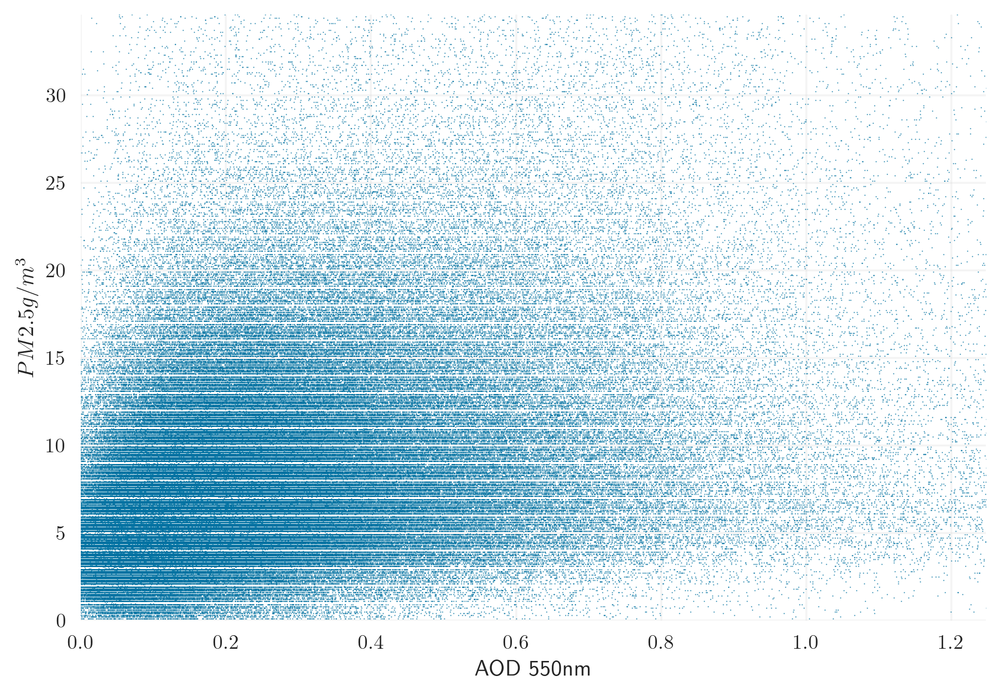

In [60]:
fig, ax = plt.subplots(dpi=300)

y = df['value']
x = df.AOD
ax.scatter(x, y, s=0.1, alpha=0.6)

ax.set_xlim((0, np.percentile(x, 99)))
ax.set_ylim((0, np.percentile(y, 99)))

ax.set_xlabel('AOD 550nm')
ax.set_ylabel('$PM2.5 µg/m^3$')

ax.tick_params(width=0)
ax.grid(alpha=0.2)
for spine in ['top', 'left', 'bottom', 'right']:
    ax.spines[spine].set_visible(False)

In [61]:
spring = 'spring'
fall = 'fall'
summer = 'summer'
winter = 'winter'
# seasons = [winter, winter, spring, spring, spring, summer, summer, summer, fall, fall, fall, winter]
seasons = [1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 1]
month_to_season = dict(zip(range(1,13), seasons))

In [62]:
# df['season'] = pd.Categorical(df.time.dt.month.map(month_to_season))
df['season'] = df.time.dt.month.map(month_to_season)

/var/folders/j8/13gdnhs51_g_jl1wlxj7h3tm0000gn/T/ipykernel_24770/2567584882.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['season'] = df.time.dt.month.map(month_to_season)


In [64]:
df.drop(columns=['proj_longitude', 'proj_latitude'], axis=1, inplace=True)
df

/var/folders/j8/13gdnhs51_g_jl1wlxj7h3tm0000gn/T/ipykernel_24770/3204973746.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['proj_longitude', 'proj_latitude'], axis=1, inplace=True)


,time,latitude,longitude,value,AOD,season
0,2021-01-01 13:00:00,25.794222,-80.215556,4.9,0.822859,1
1,2021-01-01 13:00:00,27.290556,-82.507222,10.4,0.343303,1
2,2021-01-01 13:00:00,27.785866,-82.739875,10.8,0.420182,1
4,2021-01-01 13:00:00,27.955133,-82.469532,9.8,0.786563,1
6,2021-01-01 13:00:00,28.596389,-81.362500,2.6,0.271957,1
...,...,...,...,...,...,...
643614,2021-12-31 22:00:00,33.719690,-116.189700,6.3,0.218268,1
643616,2021-12-31 22:00:00,36.270592,-115.238282,2.4,0.138026,1
643617,2021-12-31 23:00:00,32.978330,-115.539170,4.9,0.186497,1
643618,2021-12-31 23:00:00,33.708530,-116.215370,1.7,0.084358,1


In [65]:
df.describe()

,latitude,longitude,value,AOD,season
count,411713.000000,411713.000000,411713.000000,411713.000000,411713.000000
mean,37.742554,-89.755605,8.860816,0.283072,2.760581
std,4.465029,12.136046,7.276309,0.262502,0.988882
min,25.794222,-117.675930,0.100000,-0.050000,1.000000
25%,35.017080,-96.824166,4.600000,0.108101,2.000000
50%,38.773350,-86.504762,7.100000,0.211028,3.000000
75%,40.770944,-81.052500,10.900000,0.378935,4.000000
max,47.355332,-68.260900,681.000000,4.056664,4.000000


In [67]:
X, y = df.drop(columns=['value', 'time'], axis=1), df['value']
# X, y = df.AOD.values.reshape(-1, 1), df['PM2.5'].values

In [68]:
mc = ModelCollection(X, y)

In [22]:
cv_scores = mc.compute_cross_validation_scores()

  0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increas

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated

In [23]:
mc.save_model_cross_val_scores(os.path.join('data', 'no-pm-integers.pcl'))

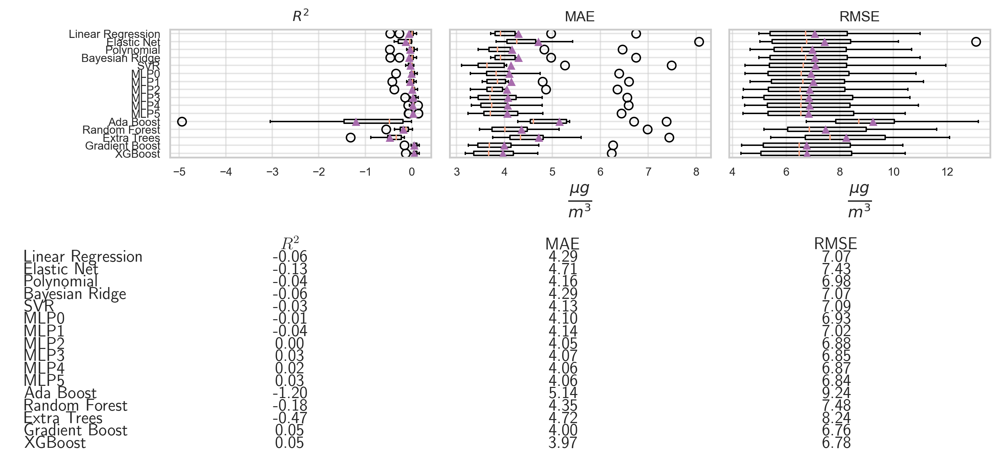

In [24]:
labels, scores = map(list, zip(*mc.cross_val_scores_.items()))
grouped_boxplot_with_table(scores, labels, save=False, fs=8);

In [84]:
sizes = df.set_index(['latitude', 'longitude', 'time']).sort_index().groupby(level=['latitude', 'longitude']).size()

In [96]:
largest = sizes[sizes == sizes.max()]

In [106]:
[[lat, lon]] = largest.index.values

In [107]:
lat, lon

(33.56031, -112.06619)

In [109]:
data = df.set_index(['latitude', 'longitude', 'time']).loc[lat, lon]

/var/folders/j8/13gdnhs51_g_jl1wlxj7h3tm0000gn/T/ipykernel_24770/4216246892.py:1: PerformanceWarning: indexing past lexsort depth may impact performance.
  data = df.set_index(['latitude', 'longitude', 'time']).loc[lat, lon]


In [110]:
data

,value,AOD,season
time,,,
2021-01-01 16:00:00,83.1,2.289156,1
2021-01-01 17:00:00,108.6,0.621295,1
2021-01-01 18:00:00,73.8,0.363324,1
2021-01-01 19:00:00,57.5,0.287157,1
2021-01-01 20:00:00,44.7,0.239502,1
...,...,...,...
2021-12-19 17:00:00,3.7,0.771485,1
2021-12-19 18:00:00,2.5,0.358842,1
2021-12-19 20:00:00,0.8,0.180608,1


In [112]:
data.reset_index(inplace=True)

In [113]:
data

,time,value,AOD,season
0,2021-01-01 16:00:00,83.1,2.289156,1
1,2021-01-01 17:00:00,108.6,0.621295,1
2,2021-01-01 18:00:00,73.8,0.363324,1
3,2021-01-01 19:00:00,57.5,0.287157,1
4,2021-01-01 20:00:00,44.7,0.239502,1
...,...,...,...,...
2218,2021-12-19 17:00:00,3.7,0.771485,1
2219,2021-12-19 18:00:00,2.5,0.358842,1
2220,2021-12-19 20:00:00,0.8,0.180608,1
2221,2021-12-19 22:00:00,0.7,0.058237,1


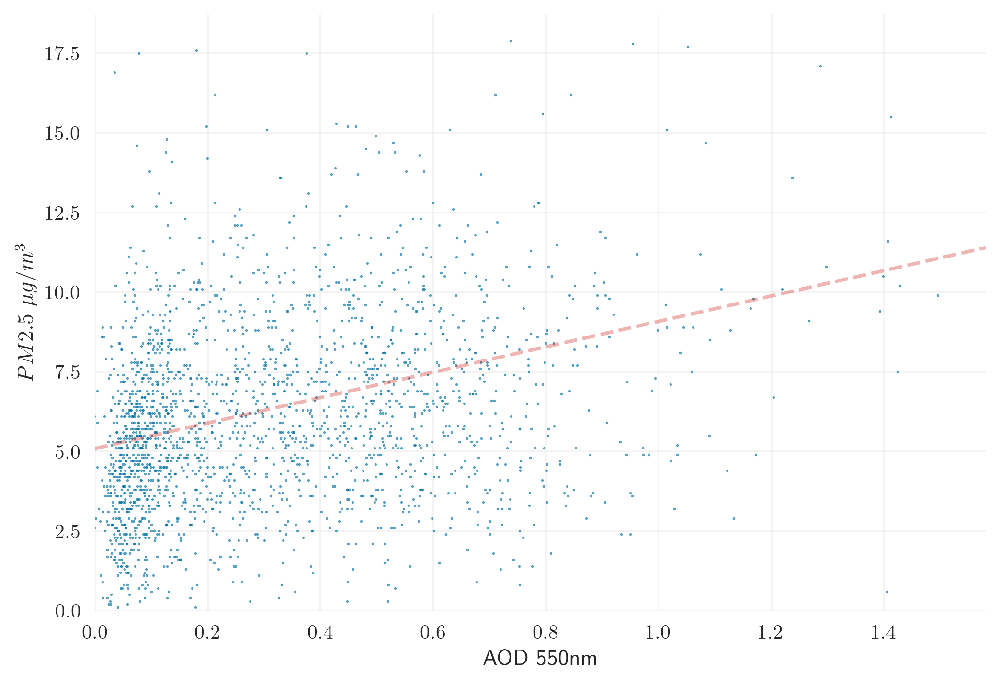

In [123]:
from sklearn.linear_model import LinearRegression
fig, ax = plt.subplots(dpi=300)

x = data.AOD
y = data.value

lin = LinearRegression().fit(x.values.reshape(-1, 1), y)

ax.scatter(x, y, s=1, alpha=0.6)

ax.axline(xy1=(0, lin.intercept_), slope=lin.coef_.item(), linestyle="--", color="r", alpha=0.3)

ax.set_xlim((0, np.percentile(x, 99)))
ax.set_ylim((0, np.percentile(y, 99)))

ax.set_xlabel('AOD 550nm')
ax.set_ylabel('$PM2.5~ \mu g/m^3$')

ax.tick_params(width=0)
ax.grid(alpha=0.2)
for spine in ['top', 'left', 'bottom', 'right']:
    ax.spines[spine].set_visible(False)

In [114]:
X, y = data.drop(columns=['value', 'time'], axis=1), data['value']

In [115]:
mc = ModelCollection(X, y)

In [116]:
cv_scores = mc.compute_cross_validation_scores()

  0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feat

/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/usr/local/Caskroom/miniconda/base/envs/geospatial/lib/python3.10/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/usr/local/Caskroom/miniconda/base/envs/geo

In [23]:
# mc.save_model_cross_val_scores(os.path.join('data', 'no-pm-integers.pcl'))

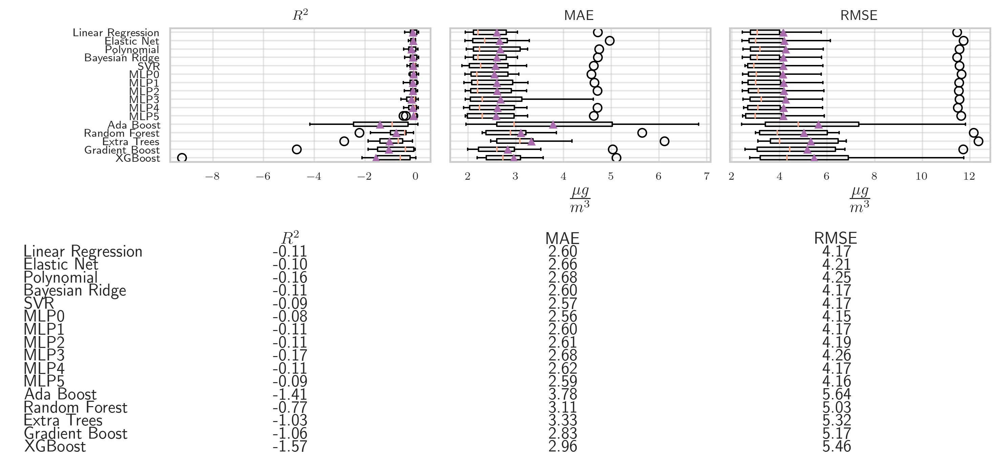

In [117]:
labels, scores = map(list, zip(*mc.cross_val_scores_.items()))
grouped_boxplot_with_table(scores, labels, save=False, fs=8);